# Cloud removal inference

* **Last Modified**: 01-06-2023
* **Authors**: Gonzalo Mateo-García, Enrique Portalés-Julià
---

> Run inference dual headed multioutput binary classification model

This notebook shows how to load a trained model from a experiment config file. With that model we will then make predictions on new Sentinel-2 images. In this case we will use a model that produce an output image with two channels. The first channel  encodes the probability of cloud and the second channel the probability of water. With this new model we are able to correctly classify land/water in partially cloud covered places and over thin and semi-transparent clouds.

In [1]:
!pip install git+https://github.com/spaceml-org/ml4floods#egg=ml4floods

## Step 1: Set bucket credentials

In [14]:
import sys, os
from pathlib import Path

os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "/home/kike/gcpcreds/ml4cc-general-access_request_pays.json"
os.environ['GS_USER_PROJECT']= 'ml4cc-general'
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

# %load_ext autoreload
# %autoreload 2

## Step 2: Load pre-trained model

The following scheme details the training and inference workflow of the WorldFloods multioutput models. We will load the pretrained model into a function that outputs a 3-class prediction by applying prediction rule detailed below:

![prediction_rule](prediction_rule.png)



In [15]:
from ml4floods.scripts.inference import load_inference_function
from ml4floods.models.model_setup import get_channel_configuration_bands

experiment_name = "WF2_unetv2_bgriswirs"

config_fp = f"gs://ml4cc_data_lake/2_PROD/2_Mart/2_MLModelMart/{experiment_name}/"


inference_function, config = load_inference_function(config_fp, device_name = 'cuda', max_tile_size=1024,
                                                     th_water=0.75, th_brightness=3000)

channel_configuration = config['data_params']['channel_configuration']
channels  = get_channel_configuration_bands(channel_configuration, collection_name='S2')

Loaded model weights: gs://ml4cc_data_lake/2_PROD/2_Mart/2_MLModelMart/WF2_unetv2_bgriswirs/model.pt
Getting model inference function


## Step 3: Helper functions for plotting and reading some demo data

In [16]:
import rasterio
import numpy as np
from rasterio import plot as rasterioplt
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib.patches as mpatches

from typing import Optional, Tuple, Union

import torch
from ml4floods.data.worldfloods.configs import BANDS_S2
from ml4floods.visualization.plot_utils import plot_segmentation_mask


@torch.no_grad()
def read_inference_pair(tiff_inputs:str, folder_ground_truth:str, 
                        window:Optional[Union[rasterio.windows.Window, Tuple[slice,slice]]], 
                        return_ground_truth: bool=False, channels:bool=None, 
                        folder_permanent_water=Optional[str],
                       cache_folder=None) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor, rasterio.Affine]:
    """
    Read a pair of layers from the worldfloods bucket and return them as Tensors to pass to a model, return the transform for plotting with lat/long
    
    Args:
        tiff_inputs: filename for layer in worldfloods bucket
        folder_ground_truth: folder name to be replaced by S2 in the input
        window: window of layer to use
        return_ground_truth: flag to indicate if paired gt layer should be returned
        channels: list of channels to read from the image
        return_permanent_water: Read permanent water layer raster
    
    Returns:
        (torch_inputs, torch_targets, transform): inputs Tensor, gt Tensor, transform for plotting with lat/long
    """
    
    if cache_folder is not None and tiff_inputs.startswith("gs"):
        tiff_inputs = download_tiff(cache_folder, tiff_inputs, folder_ground_truth, folder_permanent_water)
    
    tiff_targets = tiff_inputs.replace("/S2/", folder_ground_truth)

    with rasterio.open(tiff_inputs, "r") as rst:
        inputs = rst.read((np.array(channels) + 1).tolist(), window=window)
        # Shifted transform based on the given window (used for plotting)
        transform = rst.transform if window is None else rasterio.windows.transform(window, rst.transform)
        torch_inputs = torch.Tensor(inputs.astype(np.float32)).unsqueeze(0)
    
    if folder_permanent_water is not None:
        tiff_permanent_water = tiff_inputs.replace("/S2/", folder_permanent_water)
        with rasterio.open(tiff_permanent_water, "r") as rst:
            permanent_water = rst.read(1, window=window)  
            torch_permanent_water = torch.tensor(permanent_water)
    else:
        torch_permanent_water = torch.zeros_like(torch_inputs)
        
    if return_ground_truth:
        with rasterio.open(tiff_targets, "r") as rst:
            targets = rst.read(1, window=window)
        
        torch_targets = torch.tensor(targets).unsqueeze(0)
    else:
        torch_targets = torch.zeros_like(torch_inputs)
    
    return torch_inputs, torch_targets, torch_permanent_water, transform

COLORS_WORLDFLOODS = np.array([[0, 0, 0], # invalid
                               [139, 64, 0], # land
                               [0, 0, 139], # water
                               [220, 220, 220]], # cloud
                              dtype=np.float32) / 255

INTERPRETATION_WORLDFLOODS = ["invalid", "land", "water", "cloud"]

COLORS_WORLDFLOODS_PERMANENT = np.array([[0, 0, 0], # 0: invalid
                                         [139, 64, 0], # 1: land
                                         [237, 0, 0], # 2: flood_water
                                         [220, 220, 220], # 3: cloud
                                         [0, 0, 139], # 4: permanent_water
                                         [60, 85, 92]], # 5: seasonal_water
                                        dtype=np.float32) / 255

INTERPRETATION_WORLDFLOODS_PERMANENT = ["invalid", "land", "flood water", "cloud", "permanent water", "seasonal water"]

def gt_with_permanent_water(gt: np.ndarray, permanent_water: np.ndarray)->np.ndarray:
    """ Permanent water taken from: https://developers.google.com/earth-engine/datasets/catalog/JRC_GSW1_2_YearlyHistory"""
    gt[(gt == 2) & (permanent_water == 3)] = 4 # set as permanent_water
    gt[(gt == 2) & (permanent_water == 2)] = 5 # set as seasonal water
        
    return gt
            

def get_cmap_norm_colors(color_array, interpretation_array):
    cmap_categorical = colors.ListedColormap(color_array)
    norm_categorical = colors.Normalize(vmin=-.5,
                                        vmax=color_array.shape[0]-.5)
    patches = []
    for c, interp in zip(color_array, interpretation_array):
        patches.append(mpatches.Patch(color=c, label=interp))
    
    return cmap_categorical, norm_categorical, patches


def plot_inference_set(inputs: torch.Tensor, targets: torch.Tensor, 
                       predictions: torch.Tensor, permanent_water: torch.Tensor, transform: rasterio.Affine)->None:
    """
    Plots inputs, targets and prediction into lat/long visualisation
    
    Args:
        inputs: input Tensor
        targets: gt target Tensor
        prediction: predictions output by model (softmax, argmax already applied)
        permanent_water: permanent water raster
        transform: transform used to plot with lat/long
    """
    fig, ax = plt.subplots(2,2,figsize=(16,16))
    
    inputs_show = inputs.cpu().numpy().squeeze()
    targets_show = targets.cpu().numpy().squeeze()
    permanent_water_show = permanent_water.numpy().squeeze()
    
    targets_show = gt_with_permanent_water(targets_show, permanent_water_show)
    
    
    # Color categories {-1: invalid, 0: land, 1: water, 2: clouds}
    
    cmap_preds, norm_preds, patches_preds = get_cmap_norm_colors(COLORS_WORLDFLOODS, INTERPRETATION_WORLDFLOODS)
    cmap_gt, norm_gt, patches_gt = get_cmap_norm_colors(COLORS_WORLDFLOODS_PERMANENT, INTERPRETATION_WORLDFLOODS_PERMANENT)
    
    prediction_show = (predictions).cpu().numpy() 
    
    band_names_current_image = [BANDS_S2[iband] for iband in channels]
    bands_rgb = [band_names_current_image.index(b) for b in ["B4", "B3", "B2"]] # swir_1, nir, red composite
    bands_false_composite = [band_names_current_image.index(b) for b in ["B11", "B8", "B4"]] # swir_1, nir, red composite
    false_rgb = np.clip(inputs_show[bands_false_composite, :, :]/3000.,0,1)
    rgb = np.clip(inputs_show[bands_rgb, :, :]/3000.,0,1)
    

    rasterioplt.show(rgb,transform=transform,ax=ax[0,0])
    ax[0,0].set_title("RGB Composite")
    rasterioplt.show(false_rgb,transform=transform,ax=ax[0,1])
    ax[0,1].set_title("SWIR1,NIR,R Composite")

    plot_segmentation_mask(targets_show,transform=transform, ax = ax[1,0], 
                           color_array=COLORS_WORLDFLOODS_PERMANENT, interpretation_array=INTERPRETATION_WORLDFLOODS_PERMANENT)


    plot_segmentation_mask(prediction_show,transform=transform, ax = ax[1,1], color_array=COLORS_WORLDFLOODS, interpretation_array=INTERPRETATION_WORLDFLOODS)
    
    ax[1,0].set_title("Ground Truth")
    ax[1,0].legend(handles=patches_gt,
                 loc='upper right')
    
    ax[1,1].set_title("Prediction water")
    ax[1,1].legend(handles=patches_preds,
                   loc='upper right')
        

## Perform Inference using the `inference_function`

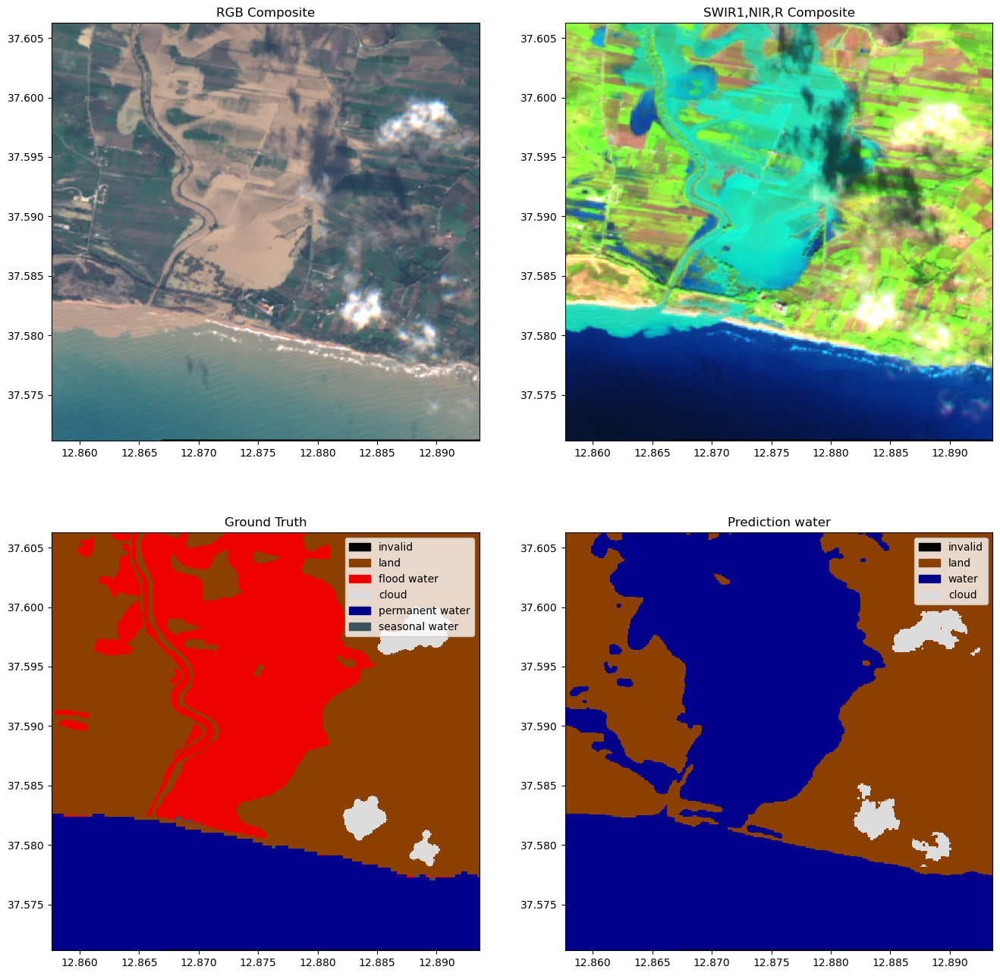

In [17]:
from ml4floods.models.model_setup import get_channel_configuration_bands

download_image = False
cache_folder = None # "tiffs_for_inference"
# os.makedirs(cache_folder, exist_ok=True)

tiff_s2, window, channels = "gs://ml4floods/worldfloods/public/test/S2/EMSR333_02PORTOPALO_DEL_MONIT01_v1_observed_event_a.tif", (slice(1000,None),slice(0,400)), get_channel_configuration_bands(config.model_params.hyperparameters.channel_configuration)

# Load the image and ground truth
torch_inputs, torch_targets, torch_permanent_water, transform = read_inference_pair(tiff_s2,folder_ground_truth="/gt/", 
                                                                                    window=window, return_ground_truth=True, channels=channels,
                                                                                    folder_permanent_water="/PERMANENTWATERJRC/",
                                                                                    cache_folder=cache_folder)

# Compute the prediction
outputs, cont_pred = inference_function(torch_inputs[0]) # 3 class prediction with (h, w)
plot_inference_set(torch_inputs, torch_targets, outputs, torch_permanent_water, transform)

## Lets try another image!

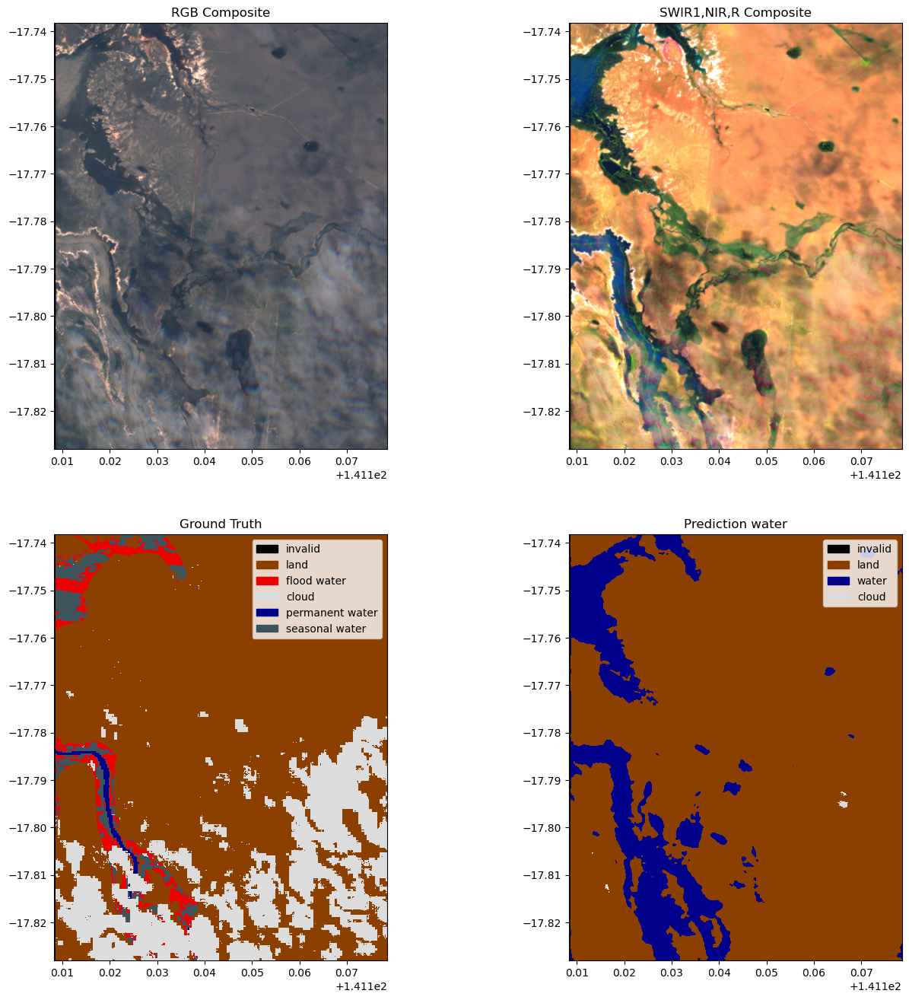

In [18]:
import rasterio.windows 
window = rasterio.windows.Window(col_off=4_860, row_off=3_300, 
                                 width=840, height=1000)

tiff_s2, channels = "gs://ml4cc_data_lake/2_PROD/2_Mart/worldfloods_v1_0/test/S2/EMSR342_06NORTHNORMANTON_DEL_v1_observed_event_a.tif", get_channel_configuration_bands(config.model_params.hyperparameters.channel_configuration)

torch_inputs, torch_targets, torch_permanent_water, transform = read_inference_pair(tiff_s2, folder_ground_truth="/gt/", 
                                                                                    window=window, 
                                                                                    return_ground_truth=True, channels=channels,
                                                                                    folder_permanent_water="/PERMANENTWATERJRC/",
                                                                                    cache_folder=None)

outputs, cont_pred = inference_function(torch_inputs[0]) # 3 class prediction with (h, w)
plot_inference_set(torch_inputs, torch_targets, outputs, torch_permanent_water, transform)


## Lets try another image!

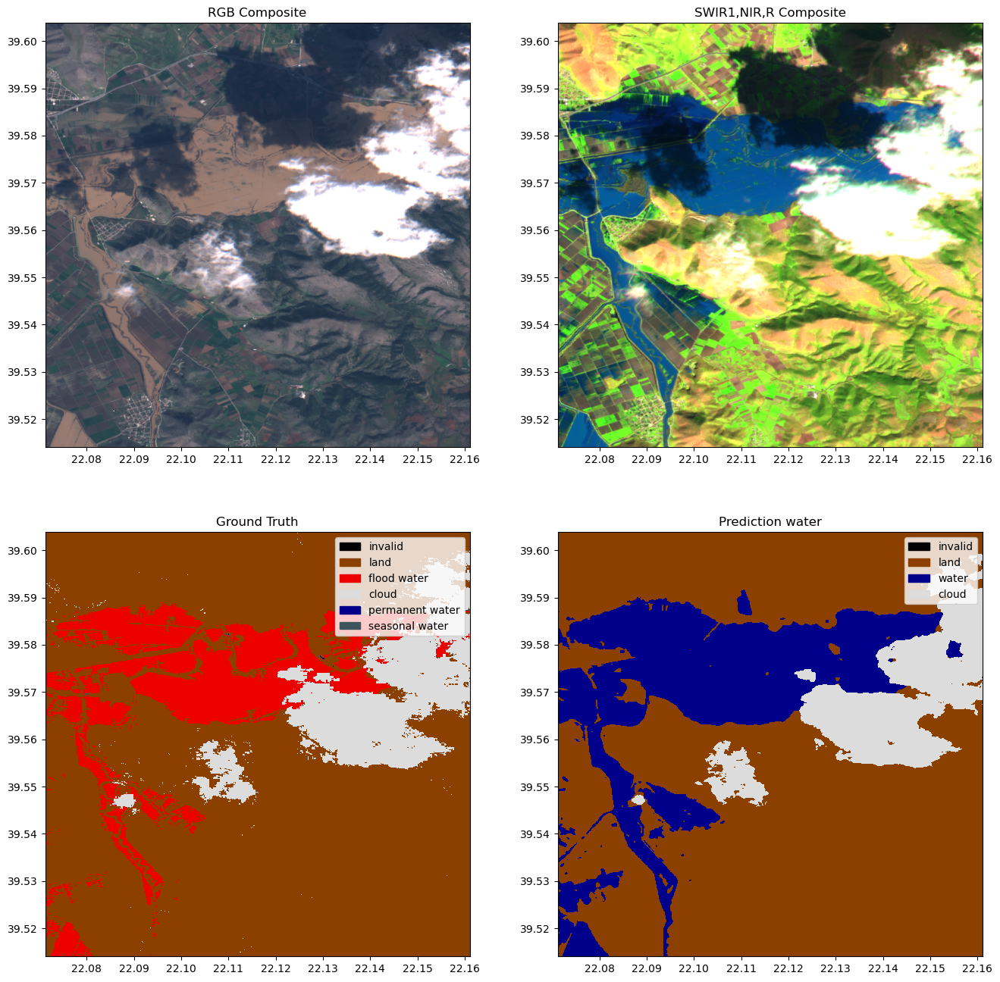

In [19]:
import rasterio.windows 
window = rasterio.windows.Window(col_off=1_600, row_off=400, 
                                 width=1000, height=1000)

tiff_s2, channels = "gs://ml4cc_data_lake/2_PROD/2_Mart/worldfloods_v1_0/val/S2/EMSR271_02FARKADONA_DEL_v1_observed_event_a.tif", get_channel_configuration_bands(config.model_params.hyperparameters.channel_configuration)

torch_inputs, torch_targets, torch_permanent_water, transform = read_inference_pair(tiff_s2, folder_ground_truth="/gt/", 
                                                                                    window=window, 
                                                                                    return_ground_truth=True, channels=channels,
                                                                                    folder_permanent_water="/PERMANENTWATERJRC/",
                                                                                    cache_folder=None)

outputs, cont_pred = inference_function(torch_inputs[0]) # 3 class prediction with (h, w)
plot_inference_set(torch_inputs, torch_targets, outputs, torch_permanent_water, transform)


## Lets try another image!

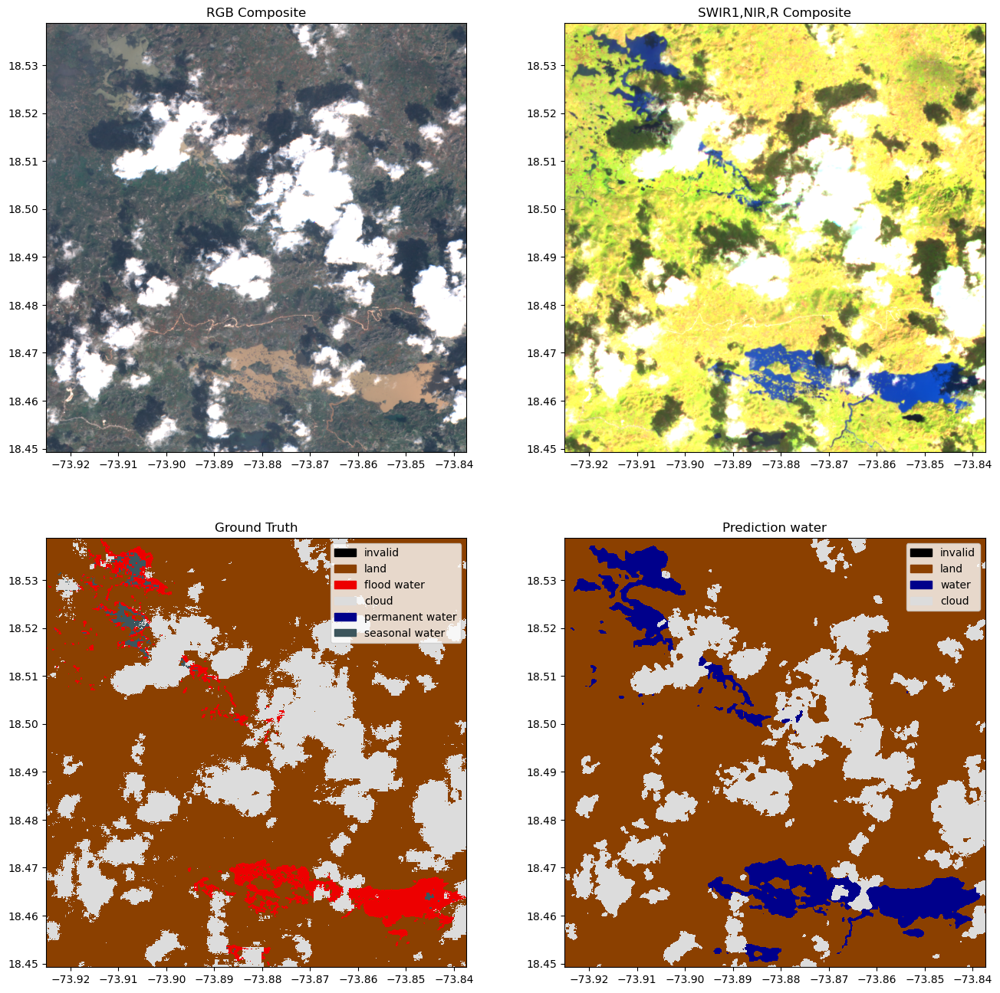

In [20]:

window = None

tiff_s2, channels = "gs://ml4cc_data_lake/2_PROD/2_Mart/worldfloods_v1_0/S2/RS2_20161008_Water_Extent_Corail_Pestel.tif", get_channel_configuration_bands(config.model_params.hyperparameters.channel_configuration)

torch_inputs, torch_targets, torch_permanent_water, transform = read_inference_pair(tiff_s2, folder_ground_truth="/gt/", 
                                                                                    window=None, 
                                                                                    return_ground_truth=True, channels=channels,
                                                                                    folder_permanent_water="/PERMANENTWATERJRC/",
                                                                                    cache_folder=None)
outputs, cont_pred = inference_function(torch_inputs[0]) # 3 class prediction with (h, w)
plot_inference_set(torch_inputs, torch_targets, outputs, torch_permanent_water, transform)


## Lets try another image!

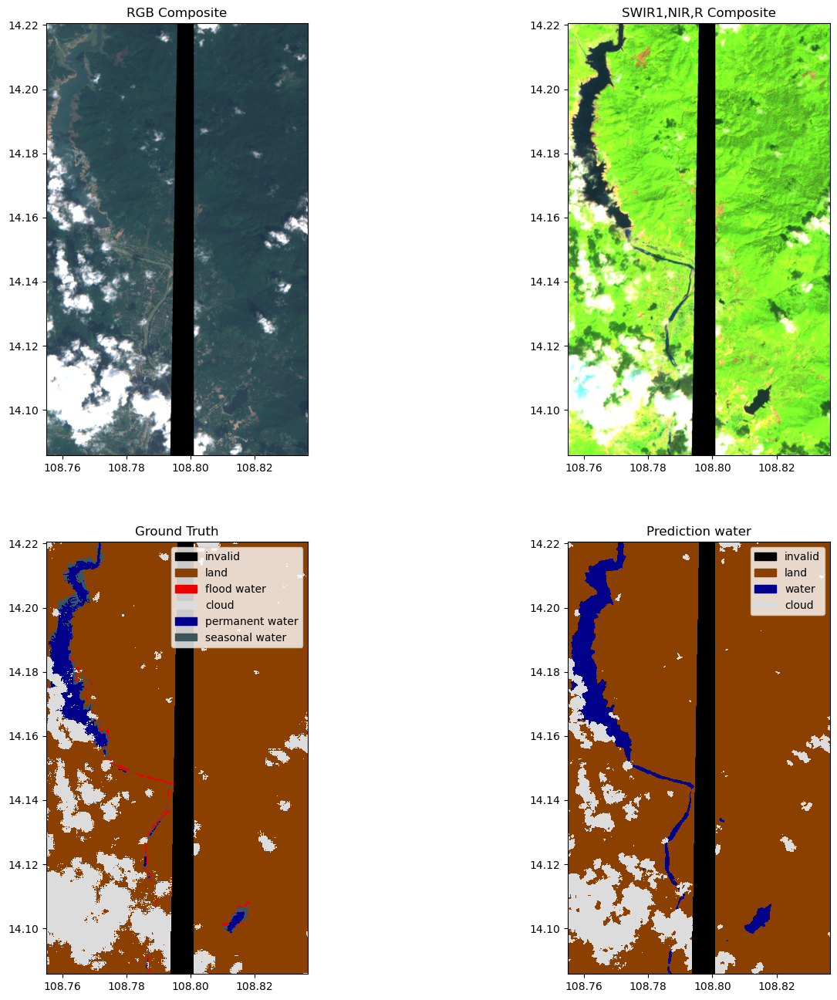

In [21]:
import rasterio.windows 
window = rasterio.windows.Window(col_off=0, row_off=1_200, 
                                 width=1000, height=1_500)

tiff_s2, channels = "gs://ml4cc_data_lake/2_PROD/2_Mart/worldfloods_v1_0/val/S2/ST1_20161014_WaterExtent_BinhDinh_Lake.tif", get_channel_configuration_bands(config.model_params.hyperparameters.channel_configuration)

torch_inputs, torch_targets, torch_permanent_water, transform = read_inference_pair(tiff_s2, folder_ground_truth="/gt/", 
                                                                                    window=window, 
                                                                                    return_ground_truth=True, channels=channels,
                                                                                    folder_permanent_water="/PERMANENTWATERJRC/",
                                                                                   cache_folder=None)


outputs, cont_pred = inference_function(torch_inputs[0]) 
plot_inference_set(torch_inputs, torch_targets, outputs, torch_permanent_water, transform)

## Lets try another image!

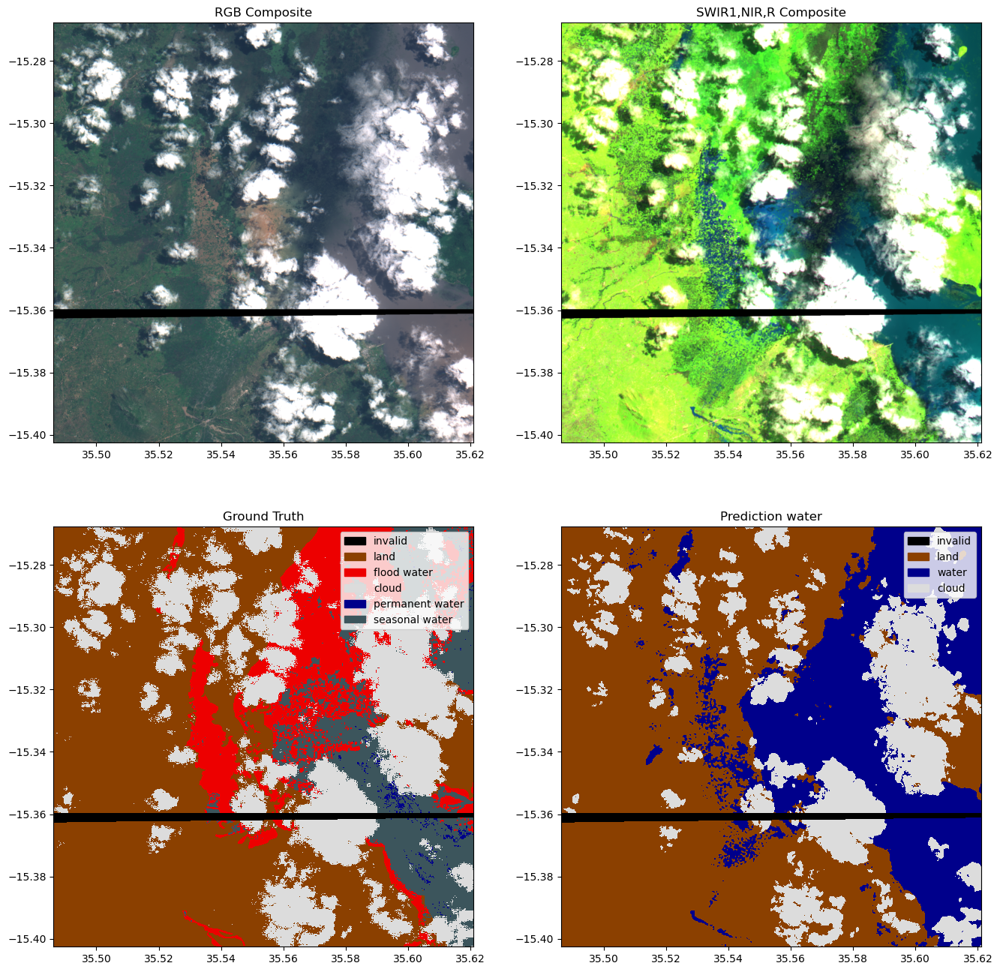

In [22]:
import rasterio.windows 
window = rasterio.windows.Window(col_off=0, row_off=0, 
                                 width=1_500, height=1_500)

tiff_s2, channels = "gs://ml4cc_data_lake/2_PROD/2_Mart/worldfloods_v1_0/test/S2/EMSR347_07ZOMBA_DEL_MONIT01_v1_observed_event_a.tif", get_channel_configuration_bands(config.model_params.hyperparameters.channel_configuration)

torch_inputs, torch_targets, torch_permanent_water, transform = read_inference_pair(tiff_s2, folder_ground_truth="/gt/", 
                                                                                    window=window, 
                                                                                    return_ground_truth=True, channels=channels,
                                                                                    folder_permanent_water="/PERMANENTWATERJRC/",
                                                                                   cache_folder=None)


outputs, cont_pred = inference_function(torch_inputs[0]) 
plot_inference_set(torch_inputs, torch_targets, outputs, torch_permanent_water, transform)

## Lets try another image from the new data prepared by the Janitors!

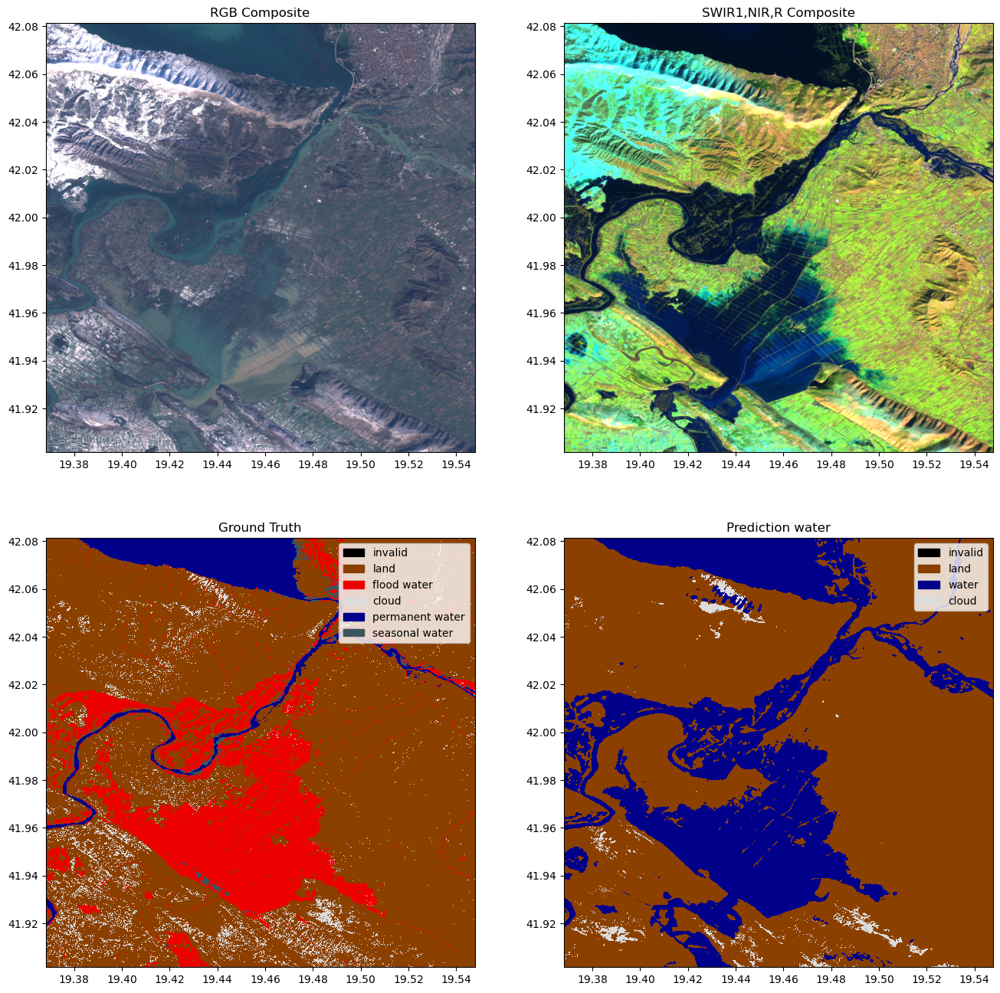

In [24]:
import rasterio.windows 
window = rasterio.windows.Window(col_off=1543, row_off=247, 
                                 width=2000, height=2000)
tiff_s2, channels = "gs://ml4cc_data_lake/2_PROD/1_Staging/WorldFloods/S2/EMSR501/AOI01/EMSR501_AOI01_DEL_MONIT01_r1_v1.tif", get_channel_configuration_bands(config.model_params.hyperparameters.channel_configuration)

torch_inputs, torch_targets, torch_permanent_water, transform = read_inference_pair(tiff_s2, folder_ground_truth="/GT/V_1_1/", 
                                                                                    window=window, 
                                                                                    return_ground_truth=True, channels=channels,
                                                                                    folder_permanent_water="/JRC/",

                                                                                    cache_folder=cache_folder)
outputs, cont_pred = inference_function(torch_inputs[0]) 
plot_inference_set(torch_inputs, torch_targets, outputs, torch_permanent_water, transform)
